In [1]:
from DiffusionMaps.DiffusionMaps import DiffusionMaps
from ModifiedPHATE.ModifiedPHATE import ModifiedPHATE
from sklearn.datasets import make_swiss_roll, make_circles, make_s_curve
from sklearn.metrics.pairwise import euclidean_distances
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from tqdm.auto import tqdm
from sklearn.manifold import *
from sklearn.decomposition import PCA, KernelPCA
from phate import PHATE
from umap import UMAP
from itertools import product

In [2]:
def make_helix_torus(n_samples=500):
    t = np.random.uniform(0, 2*np.pi, n_samples)
    r = 1/4
    R = 1
    n = 10
    x = (R+r*np.cos(n*t))*np.cos(t)
    y = (R+r*np.cos(n*t))*np.sin(t)
    z = r*np.sin(n*t)
    return np.array([x, y, z]).T, t

def make_helix_sphere(n_samples=500):
    t = np.random.uniform(-np.pi/2, np.pi/2, n_samples)
    s = 2*t
    r = np.sin(5*t)**2 - 0.25
    R = 1
    n = 5
    x = np.cos(n*s)*np.cos(t)
    y = np.sin(n*s)*np.cos(t)
    z = np.sin(t)
    return np.array([x, y, z]).T, t


def make_circle(n_samples=500):
    t = np.random.uniform(0, 2*np.pi, n_samples)
    R = 1
    n = 10
    x = R*np.cos(t)
    y = R*np.sin(t)
    z = len(x)*[0]
    return np.array([x, y, z]).T, t
    

In [3]:
#1D datasets
datasets = {}
n_samples = 200
datasets["swiss_roll"] = make_swiss_roll(n_samples)
datasets["s_curve"] = make_s_curve(n_samples)
datasets["helix_torus"] = make_helix_torus(n_samples)
datasets["helix_sphere"] = make_helix_sphere(n_samples)
datasets["circle"] = make_circle(n_samples)

In [4]:
methods = {
    "Laplacian eigenmaps": SpectralEmbedding(),
    "t-SNE": TSNE(),
    "PCA": PCA(),
    "KernelPCA": KernelPCA(kernel="rbf"),
    "PHATE": PHATE(verbose=0),
    "UMAP": UMAP(),
    "Isomap": Isomap(),
    "ModifiedPHATE": ModifiedPHATE(t=10, knn=25, verbose=0),
    "DiffusionMaps_knn5": DiffusionMaps(),
    "DiffusionMaps_knn25": DiffusionMaps(knn=25),
    "DiffusionMaps_knn100": DiffusionMaps(knn=100),
    "DiffusionMaps_knn100_t5": DiffusionMaps(knn=100, t=5),
    "DiffusionMaps_knn100_t25": DiffusionMaps(knn=100, t=25),
    "DiffusionMaps_knn100_t100": DiffusionMaps(knn=100, t=100),
    "DiffusionMaps_noknn": DiffusionMaps(knn=None)
}

In [5]:
sns.set_theme(font_scale=4)
scale=20
n_methods=len(methods.keys())
n_datasets=len(datasets.keys())
fig, axes = plt.subplots(n_methods, n_datasets, figsize=(scale*n_datasets, scale*n_methods))

for (method, dataset), ax in zip(product(methods.keys(), datasets.keys()), tqdm(axes.ravel())):
    #print(method, dataset)
    embedding = methods[method].fit_transform(datasets[dataset][0])
    plt.sca(ax)
    plt.title(dataset)
    plt.ylabel(method)
    plt.scatter(*embedding[:, :2].T, s=100, c=datasets[dataset][1])
    
plt.savefig("manifold.pdf")

  0%|          | 0/75 [00:00<?, ?it/s]

epsilon used: 39.070967513525765
epsilon used: 39.070967513525765
epsilon used: 39.070967513525765
epsilon used: 39.070967513525765
epsilon used: 39.070967513525765
epsilon used: 39.070967513525765
epsilon used: 39.070967513525765


In [6]:
np.linalg.matrix_power(methods["DiffusionMaps_knn100_t100"].symmetric_diff_op, 1) == np.linalg.matrix_power(methods["DiffusionMaps_knn100_t25"].symmetric_diff_op, 1)

array([[ True,  True,  True, ...,  True,  True,  True],
       [ True,  True,  True, ...,  True,  True,  True],
       [ True,  True,  True, ...,  True,  True,  True],
       ...,
       [ True,  True,  True, ...,  True,  True,  True],
       [ True,  True,  True, ...,  True,  True,  True],
       [ True,  True,  True, ...,  True,  True,  True]])

In [7]:
methods["ModifiedPHATE"]

/home/shussain/miniconda3/lib/python3.7/site-packages/sklearn/base.py:213: FutureWarning: From version 0.24, get_params will raise an AttributeError if a parameter cannot be retrieved as an instance attribute. Previously it would return None.
  FutureWarning)


ModifiedPHATE(knn=25, t=10, verbose=0)

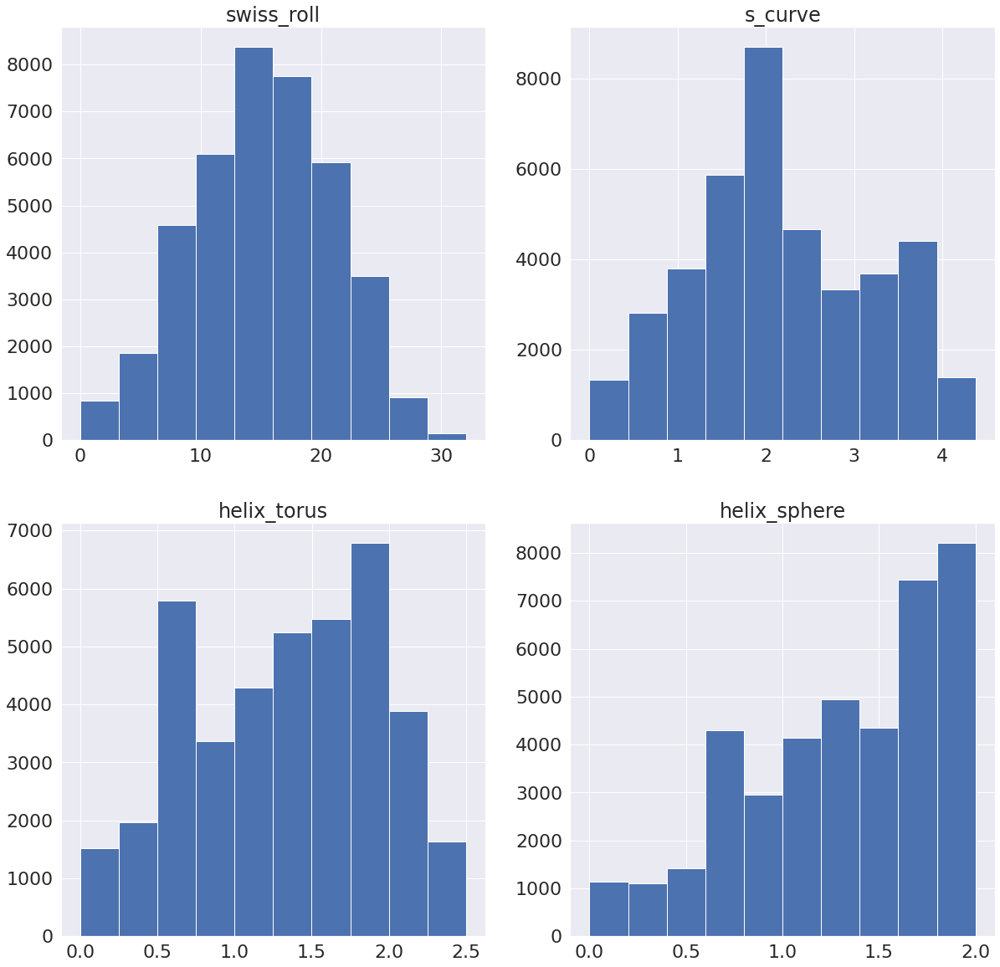

In [8]:
from sklearn.metrics.pairwise import euclidean_distances
sns.set_theme(font_scale=2)
distance_matrices = {dataset: euclidean_distances(datasets[dataset][0]) for dataset in datasets.keys()}

fig, axes = plt.subplots(2, 2, figsize=(20, 20))

for (d_set, d_mat), ax in zip(distance_matrices.items(), axes.ravel()):
    plt.sca(ax)
    plt.hist(d_mat.ravel())
    plt.title(d_set)

  0%|          | 0/35 [00:00<?, ?it/s]

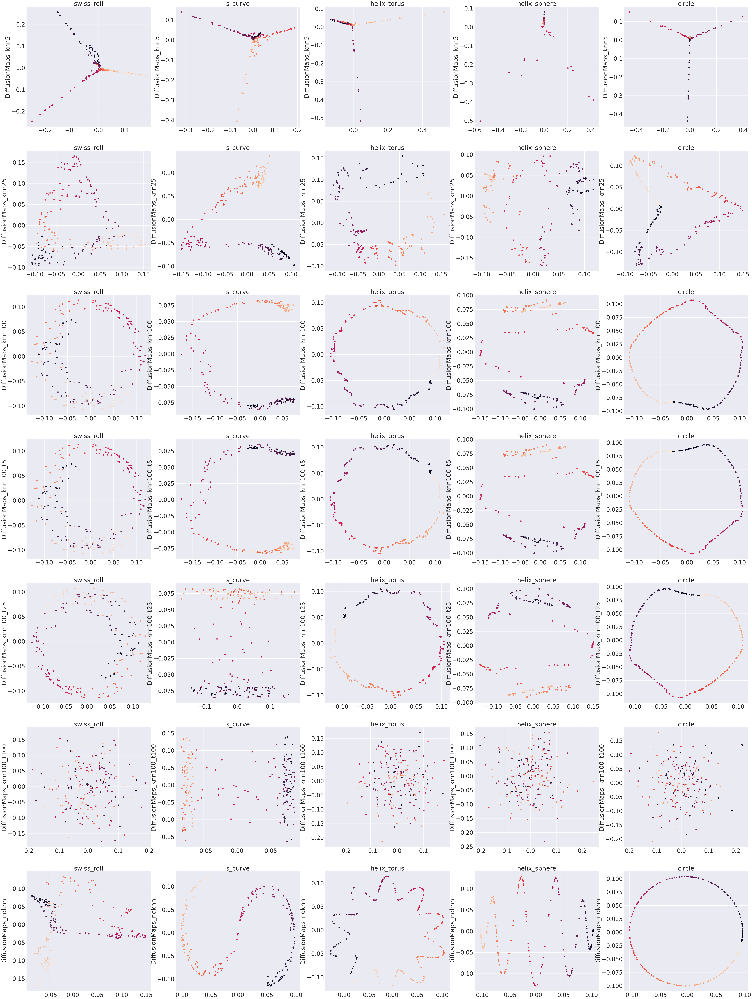

In [17]:
sns.set_theme(font_scale=4)

DMs = {
    "DiffusionMaps_knn5": DiffusionMaps(),
    "DiffusionMaps_knn25": DiffusionMaps( knn=25),
    "DiffusionMaps_knn100": DiffusionMaps( knn=100),
    "DiffusionMaps_knn100_t5": DiffusionMaps( knn=100, t=5),
    "DiffusionMaps_knn100_t25": DiffusionMaps( knn=100, t=25),
    "DiffusionMaps_knn100_t100": DiffusionMaps( knn=100, t=100),
    "DiffusionMaps_noknn": DiffusionMaps( knn=None)
}

scale=20
n_methods=len(DMs.keys())
n_datasets=len(datasets.keys())
fig, axes = plt.subplots(n_methods, n_datasets, figsize=(scale*n_datasets, scale*n_methods))

for (method, dataset), ax in zip(product(DMs.keys(), datasets.keys()), tqdm(axes.ravel())):
    #print(method, dataset)
    embedding = methods[method].fit_transform(datasets[dataset][0])
    plt.sca(ax)
    plt.title(dataset)
    plt.ylabel(method)
    plt.scatter(*embedding[:, :2].T, s=100, c=datasets[dataset][1])
    
plt.savefig("DMs.pdf")

In [19]:
DMs["DiffusionMaps_knn5"].kernel

In [10]:
dist = euclidean_distances(X)
p=0.01
n = dist.shape[1]
k = np.ceil(p*n)
k = int(k if k>2 else 2)  # use k of at least 2
d_sort =  np.sort(dist, axis=0)
dist_knn = d_sort[k+1:] # find dists. to kth nearest neighbor
epsilon = 2*np.median(dist_knn)**2
epsilon

NameError: name 'X' is not defined

In [ ]:
fig, axes = plt.subplots(3, 2, figsize=(10, 10))
Knn = [3, 5, 25, 50, 100, 300]
for knn, ax in zip(Knn, axes.ravel()):
    DM = DiffusionMaps(distance_metric="precomputed", knn=knn, epsilon=epsilon)
    DMs = DM.fit_transform(dist)
    plt.sca(ax)
    plt.scatter(DMs[:, 0], DMs[:, 1], c=t)

In [ ]:
from scipy.sparse.linalg import eigs
evals, evecs = eigs(DM.P)

In [ ]:
plt.scatter(evecs[:, 1], evecs[:, 2])